In [70]:
# NASA Battery Dataset Analysis - ThinkClock Battery Labs
# =========================================================
# 
# **Data Source:** https://www.kaggle.com/datasets/patrickfleith/nasa-battery-dataset/data
#
# ## Problem Statement:
# A set of Li-ion batteries were run through different operational profiles (charge, discharge, and impedance) at various temperatures. This notebook addresses:
#
# ### **Question A:** 3D EIS Plot
# Create a 3D plot from EIS measurements showing:
# - **X-axis:** Re(Z) - Real part of Impedance
# - **Y-axis:** Im(Z) - Imaginary part of Impedance  
# - **Z-axis:** Aging (Cycle count)
#
# ### **Question B:** Incremental Capacity Analysis (dQ/dV)
# - Derive dQ/dV vs V plot showing rate of capacity change w.r.t. voltage
# - Create 3D plot showing how dQ/dV peaks change w.r.t. Aging (cycle count)
#
# ### **Question C:** Machine Learning Model
# Train a model to predict current capacity of battery cell from EIS signature

In [71]:
# Install required packages
%pip install matplotlib plotly scipy scikit-learn xgboost pandas numpy nbformat -q

Note: you may need to restart the kernel to use updated packages.


In [72]:
# =============================================================================
# CELL 1: Import Required Libraries
# =============================================================================
# Standard data manipulation and numerical libraries
import pandas as pd
import numpy as np
import os
import glob
import warnings
warnings.filterwarnings('ignore')

# Visualization libraries
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# Signal processing for smoothing
from scipy.ndimage import gaussian_filter1d
from scipy.signal import savgol_filter, find_peaks

# Machine Learning libraries
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Try importing XGBoost (optional)
try:
    import xgboost as xgb
    XGBOOST_AVAILABLE = True
    print("✓ XGBoost is available")
except ImportError:
    XGBOOST_AVAILABLE = False
    print("⚠ XGBoost not available, will use Random Forest only")

print("✓ All required libraries imported successfully")

✓ XGBoost is available
✓ All required libraries imported successfully


In [73]:
# =============================================================================
# CELL 2: Configuration and File Paths
# =============================================================================
# Define paths - update these if your data is in a different location
DATA_DIR = "cleaned_dataset/data"
METADATA_PATH = "cleaned_dataset/metadata.csv"

# Verify paths exist
if os.path.exists(METADATA_PATH):
    print(f"✓ Metadata file found: {METADATA_PATH}")
else:
    print(f"✗ Metadata file NOT found: {METADATA_PATH}")

if os.path.exists(DATA_DIR):
    num_files = len(glob.glob(os.path.join(DATA_DIR, "*.csv")))
    print(f"✓ Data directory found with {num_files} CSV files")
else:
    print(f"✗ Data directory NOT found: {DATA_DIR}")

✓ Metadata file found: cleaned_dataset/metadata.csv
✓ Data directory found with 7565 CSV files


In [74]:
# =============================================================================
# CELL 3: Data Loading Functions (Modular Design)
# =============================================================================

def load_metadata(filepath):
    """
    Load and preprocess the metadata file.
    
    The metadata contains information about each test cycle:
    - type: 'discharge', 'charge', or 'impedance'
    - battery_id: Identifier for the battery (e.g., B0047)
    - Capacity: Measured capacity (only for discharge cycles)
    - Re, Rct: Impedance parameters (only for impedance cycles)
    
    Returns:
        pd.DataFrame: Cleaned metadata with proper types
    """
    df = pd.read_csv(filepath)
    
    # Convert capacity to numeric, handling NaN values
    df['Capacity'] = pd.to_numeric(df['Capacity'], errors='coerce')
    df['Re'] = pd.to_numeric(df['Re'], errors='coerce')
    df['Rct'] = pd.to_numeric(df['Rct'], errors='coerce')
    
    # Filter out invalid capacity values (0 or NaN for discharge cycles)
    print(f"Total records in metadata: {len(df)}")
    print(f"Discharge cycles: {len(df[df['type'] == 'discharge'])}")
    print(f"Charge cycles: {len(df[df['type'] == 'charge'])}")
    print(f"Impedance cycles: {len(df[df['type'] == 'impedance'])}")
    print(f"Unique batteries: {df['battery_id'].nunique()}")
    
    return df


def load_cycle_data(filename, data_dir=DATA_DIR):
    """
    Load data for a specific test cycle.
    
    Args:
        filename: Name of the CSV file (e.g., '00001.csv')
        data_dir: Directory containing the data files
        
    Returns:
        pd.DataFrame: Cycle data or None if file not found
    """
    filepath = os.path.join(data_dir, filename)
    if os.path.exists(filepath):
        try:
            return pd.read_csv(filepath)
        except Exception as e:
            print(f"Error loading {filename}: {e}")
            return None
    else:
        return None


def load_discharge_data_for_battery(metadata, battery_id, data_dir=DATA_DIR):
    """
    Load all discharge cycle data for a specific battery.
    
    Args:
        metadata: DataFrame with metadata
        battery_id: Battery identifier (e.g., 'B0047')
        data_dir: Directory containing data files
        
    Returns:
        dict: {cycle_number: (DataFrame, capacity)} for each discharge cycle
    """
    discharge_cycles = metadata[(metadata['type'] == 'discharge') & 
                                 (metadata['battery_id'] == battery_id) &
                                 (metadata['Capacity'] > 0)]  # Filter valid capacities
    
    discharge_data = {}
    for _, row in discharge_cycles.iterrows():
        df = load_cycle_data(row['filename'], data_dir)
        if df is not None and len(df) > 10:  # Minimum data points required
            cycle_num = row['test_id']
            capacity = row['Capacity']
            discharge_data[cycle_num] = (df, capacity)
    
    print(f"Loaded {len(discharge_data)} valid discharge cycles for {battery_id}")
    return discharge_data


# Load metadata
metadata = load_metadata(METADATA_PATH)
metadata.head(10)

Total records in metadata: 7565
Discharge cycles: 2794
Charge cycles: 2815
Impedance cycles: 1956
Unique batteries: 34


,type,start_time,ambient_temperature,battery_id,test_id,uid,filename,Capacity,Re,Rct
0,discharge,[2010. 7. 21. 15. 0. ...,4,B0047,0,1,00001.csv,1.674305,NaN,NaN
1,impedance,[2010. 7. 21. 16. 53. ...,24,B0047,1,2,00002.csv,NaN,0.056058,0.200970
2,charge,[2010. 7. 21. 17. 25. ...,4,B0047,2,3,00003.csv,NaN,NaN,NaN
3,impedance,[2010 7 21 20 31 5],24,B0047,3,4,00004.csv,NaN,0.053192,0.164734
4,discharge,[2.0100e+03 7.0000e+00 2.1000e+01 2.1000e+01 2...,4,B0047,4,5,00005.csv,1.524366,NaN,NaN
5,charge,[2010. 7. 21. 22. 38. ...,4,B0047,5,6,00006.csv,NaN,NaN,NaN
6,discharge,[2.010e+03 7.000e+00 2.200e+01 1.000e+00 4.000...,4,B0047,6,7,00007.csv,1.508076,NaN,NaN
7,charge,[2010. 7. 22. 3. 14. ...,4,B0047,7,8,00008.csv,NaN,NaN,NaN
8,discharge,[2010. 7. 22. 6. 16. ...,4,B0047,8,9,00009.csv,1.483558,NaN,NaN
9,charge,[2010. 7. 22. 7. 50. ...,4,B0047,9,10,00010.csv,NaN,NaN,NaN


---
# Question A: 3D EIS Plot (Re(Z) vs Im(Z) vs Cycle)

## Physics Background - Electrochemical Impedance Spectroscopy (EIS):
- **EIS** applies AC signals at various frequencies to measure battery impedance
- The response contains **Real (Re)** and **Imaginary (Im)** parts
- **Nyquist Plot:** Im(Z) vs Re(Z) shows semicircles representing different processes
- As battery ages, impedance increases (semicircle grows larger)
- **This 3D visualization** shows how the Nyquist plot evolves with cycle count (aging)

In [75]:
# =============================================================================
# Question A: Load EIS Data and Create 3D Impedance Plot
# =============================================================================

def parse_complex_value(complex_str):
    """Parse complex impedance string to get Real and Imaginary parts."""
    try:
        if isinstance(complex_str, complex):
            return complex_str.real, complex_str.imag
        complex_str = str(complex_str).strip()
        complex_val = complex(complex_str.replace('j', 'j'))
        return complex_val.real, complex_val.imag
    except:
        return np.nan, np.nan


def load_eis_for_3d_plot(metadata, battery_id, data_dir=DATA_DIR, max_cycles=50):
    """
    Load EIS data for 3D visualization: Re(Z) vs Im(Z) vs Cycle Number.
    
    Returns:
        dict: {cycle_num: {'Re': array, 'Im': array}} for each impedance cycle
    """
    # Get impedance cycles for this battery
    impedance_cycles = metadata[(metadata['type'] == 'impedance') & 
                                 (metadata['battery_id'] == battery_id)].copy()
    
    # Sort by test_id to get chronological order
    impedance_cycles = impedance_cycles.sort_values('test_id')
    
    eis_data = {}
    cycle_count = 0  # This represents aging (how many cycles the battery has gone through)
    
    for _, row in impedance_cycles.iterrows():
        if cycle_count >= max_cycles:
            break
            
        filepath = os.path.join(data_dir, row['filename'])
        if not os.path.exists(filepath):
            continue
            
        try:
            df = pd.read_csv(filepath)
            impedance_col = 'Rectified_Impedance' if 'Rectified_Impedance' in df.columns else 'Battery_impedance'
            
            re_values = []
            im_values = []
            
            for val in df[impedance_col].dropna():
                re_val, im_val = parse_complex_value(val)
                if not np.isnan(re_val):
                    re_values.append(re_val)
                    im_values.append(im_val)
            
            if len(re_values) >= 5:
                eis_data[cycle_count] = {
                    'Re': np.array(re_values),
                    'Im': np.array(im_values),
                    'test_id': row['test_id'],
                    'filename': row['filename']
                }
                cycle_count += 1
                
        except Exception as e:
            continue
    
    print(f"Loaded EIS data from {len(eis_data)} impedance cycles for battery {battery_id}")
    return eis_data


# Load EIS data for 3D plot
battery_id_eis = 'B0047'
eis_3d_data = load_eis_for_3d_plot(metadata, battery_id_eis, max_cycles=30)

print(f"\nSample cycle data:")
for cycle in list(eis_3d_data.keys())[:3]:
    data = eis_3d_data[cycle]
    print(f"  Cycle {cycle}: {len(data['Re'])} points, Re range: [{data['Re'].min():.4f}, {data['Re'].max():.4f}]")

Loaded EIS data from 30 impedance cycles for battery B0047

Sample cycle data:
  Cycle 0: 39 points, Re range: [0.0441, 0.1749]
  Cycle 1: 39 points, Re range: [0.0461, 0.1455]
  Cycle 2: 39 points, Re range: [0.0488, 0.1751]


In [76]:
# =============================================================================
# Question A: Interactive 3D EIS Plot (Plotly) - Re(Z) vs Im(Z) vs Cycle
# =============================================================================

import plotly.io as pio
pio.renderers.default = "notebook"

def create_3d_eis_plot_plotly(eis_data, title="3D EIS Plot"):
    """
    Create interactive 3D plot showing EIS evolution with aging.
    
    X-axis: Re(Z) - Real part of Impedance (Ohms)
    Y-axis: Im(Z) - Imaginary part of Impedance (Ohms) 
    Z-axis: Cycle Number (Aging indicator)
    
    As battery ages:
    - Impedance increases (curves shift right and expand)
    - Semicircle diameter increases (higher charge transfer resistance)
    """
    fig = go.Figure()
    
    cycles = sorted(eis_data.keys())
    
    # Color scale based on aging
    colors = plt.cm.viridis(np.linspace(0, 1, len(cycles)))
    
    for i, cycle_num in enumerate(cycles):
        data = eis_data[cycle_num]
        re_z = data['Re']
        im_z = data['Im']
        
        # Z-axis is cycle number (constant for each cycle's curve)
        cycle_array = np.full_like(re_z, cycle_num)
        
        # Convert matplotlib color to plotly rgb format
        r, g, b = int(colors[i][0]*255), int(colors[i][1]*255), int(colors[i][2]*255)
        
        fig.add_trace(go.Scatter3d(
            x=re_z,
            y=im_z,
            z=cycle_array,
            mode='lines+markers',
            name=f'Cycle {cycle_num}',
            line=dict(width=3, color=f'rgb({r},{g},{b})'),
            marker=dict(size=2, color=f'rgb({r},{g},{b})'),
            showlegend=True if i % 5 == 0 else False  # Show every 5th in legend
        ))
    
    fig.update_layout(
        title=dict(
            text=f'{title}<br><sub>Battery {battery_id_eis} - Color indicates aging (dark=fresh, light=aged)</sub>',
            x=0.5
        ),
        scene=dict(
            xaxis_title='Re(Z) - Real Impedance (Ω)',
            yaxis_title='Im(Z) - Imaginary Impedance (Ω)',
            zaxis_title='Cycle Number (Aging)',
            camera=dict(eye=dict(x=1.5, y=1.5, z=1.0))
        ),
        width=1000,
        height=700,
        showlegend=True
    )
    
    return fig


# Create and display 3D EIS plot
print("=" * 70)
print("QUESTION A: 3D EIS Plot - Re(Z) vs Im(Z) vs Cycle Number")
print("=" * 70)
fig_eis_3d = create_3d_eis_plot_plotly(eis_3d_data, "3D EIS Nyquist Plot Evolution with Aging")
fig_eis_3d

QUESTION A: 3D EIS Plot - Re(Z) vs Im(Z) vs Cycle Number


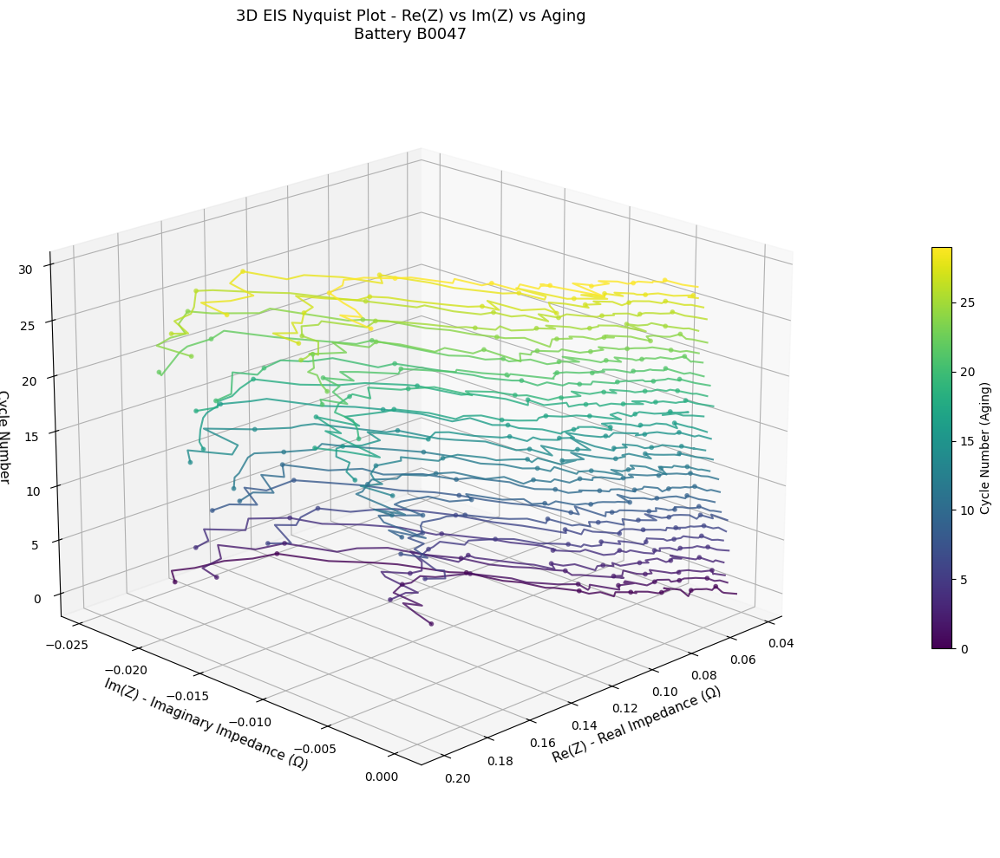


✓ Question A Complete: 3D EIS plot shows impedance evolution with battery aging


In [77]:
# =============================================================================
# Question A: Static Matplotlib 3D EIS Plot (for publication)
# =============================================================================

def create_matplotlib_3d_eis_plot(eis_data, title="3D EIS Plot"):
    """Create static 3D EIS plot using matplotlib."""
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    cycles = sorted(eis_data.keys())
    colors = plt.cm.viridis(np.linspace(0, 1, len(cycles)))
    
    for i, cycle_num in enumerate(cycles):
        data = eis_data[cycle_num]
        re_z = data['Re']
        im_z = data['Im']
        cycle_array = np.full_like(re_z, cycle_num)
        
        ax.plot(re_z, im_z, cycle_array, color=colors[i], linewidth=1.5, alpha=0.8)
        ax.scatter(re_z[::5], im_z[::5], cycle_array[::5], color=colors[i], s=10, alpha=0.6)
    
    ax.set_xlabel('Re(Z) - Real Impedance (Ω)', fontsize=11)
    ax.set_ylabel('Im(Z) - Imaginary Impedance (Ω)', fontsize=11)
    ax.set_zlabel('Cycle Number', fontsize=11)
    ax.set_title(f'{title}\nBattery {battery_id_eis}', fontsize=13)
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(cycles), vmax=max(cycles)))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, shrink=0.5, aspect=20, pad=0.1)
    cbar.set_label('Cycle Number (Aging)', fontsize=10)
    
    ax.view_init(elev=20, azim=45)
    plt.tight_layout()
    return fig


fig_eis_mpl = create_matplotlib_3d_eis_plot(eis_3d_data, "3D EIS Nyquist Plot - Re(Z) vs Im(Z) vs Aging")
plt.show()

print("\n✓ Question A Complete: 3D EIS plot shows impedance evolution with battery aging")

---
# Question B: Incremental Capacity Analysis (dQ/dV)

## Physics Background:
**Incremental Capacity Analysis (ICA)** reveals phase transitions in electrode materials:

1. **What is dQ/dV?**
   - Rate of charge change with respect to voltage: dQ/dV = ΔQ / ΔV
   - Peaks correspond to voltage plateaus where electrochemical reactions occur

2. **Why is it useful?**
   - As batteries age, peaks **shift** in voltage position
   - Peak **heights decrease** indicating capacity fade
   - Peak **shapes broaden** due to increased resistance

3. **3D Visualization Goal:**
   - X-axis: Voltage (V)
   - Y-axis: Cycle Number (Aging)
   - Z-axis: |dQ/dV| (Ah/V)

In [78]:
# =============================================================================
# CELL 4: Incremental Capacity (dQ/dV) Calculation Functions
# =============================================================================

def calculate_incremental_capacity(df, voltage_col='Voltage_measured', 
                                   current_col='Current_measured',
                                   time_col='Time', 
                                   smooth_window=15, 
                                   smooth_polyorder=3):
    """
    Calculate incremental capacity (dQ/dV) from discharge data.
    
    Physics Notes:
    - Charge Q = ∫I·dt (integral of current over time)
    - dQ/dV represents phase transitions in electrode materials
    - Smoothing is CRITICAL because numerical differentiation amplifies noise
    
    Args:
        df: DataFrame with voltage, current, and time columns
        voltage_col: Name of voltage column
        current_col: Name of current column  
        time_col: Name of time column
        smooth_window: Window size for Savitzky-Golay filter (must be odd)
        smooth_polyorder: Polynomial order for smoothing
        
    Returns:
        tuple: (voltage_array, dqdv_array) with valid data points
    """
    # Make a copy and sort by time
    data = df.copy()
    data = data.sort_values(time_col).reset_index(drop=True)
    
    # Extract arrays
    voltage = data[voltage_col].values
    current = data[current_col].values  # Current in Amps
    time = data[time_col].values  # Time in seconds
    
    # Calculate charge Q by integrating current over time
    # Q = ∫I·dt, using trapezoidal integration
    # Convert to Ah: divide by 3600 (seconds per hour)
    dt = np.diff(time)  # Time intervals
    avg_current = (current[:-1] + current[1:]) / 2  # Average current in each interval
    dQ = avg_current * dt / 3600  # Charge increment in Ah
    Q = np.cumsum(dQ)  # Cumulative charge
    Q = np.insert(Q, 0, 0)  # Add initial Q=0
    
    # For discharge, capacity should be positive but current is negative
    # Take absolute value to get positive capacity
    Q = np.abs(Q)
    
    # Apply smoothing to voltage and capacity before differentiation
    # Savitzky-Golay filter preserves peak shapes better than Gaussian
    if len(Q) > smooth_window:
        Q_smooth = savgol_filter(Q, smooth_window, smooth_polyorder)
        V_smooth = savgol_filter(voltage, smooth_window, smooth_polyorder)
    else:
        Q_smooth = Q
        V_smooth = voltage
    
    # Calculate dQ/dV using numerical differentiation
    # Note: We compute dQ/dV, not dV/dQ
    dV = np.diff(V_smooth)
    dQ_vals = np.diff(Q_smooth)
    
    # Avoid division by zero - only keep points where voltage changes significantly
    valid_mask = np.abs(dV) > 1e-6
    
    dqdv = np.zeros_like(dV)
    dqdv[valid_mask] = dQ_vals[valid_mask] / dV[valid_mask]
    
    # Use midpoint voltages for dQ/dV values
    V_mid = (V_smooth[:-1] + V_smooth[1:]) / 2
    
    # Apply additional smoothing to dQ/dV to reduce noise
    if len(dqdv) > smooth_window:
        dqdv_smooth = savgol_filter(dqdv, smooth_window, smooth_polyorder)
    else:
        dqdv_smooth = dqdv
    
    # Filter to valid voltage range (typically 2.5V to 4.2V for Li-ion)
    valid_range = (V_mid > 2.5) & (V_mid < 4.2)
    
    return V_mid[valid_range], dqdv_smooth[valid_range]


def find_dqdv_peaks(voltage, dqdv, height_threshold=0.5, prominence=0.2):
    """
    Find peaks in the dQ/dV curve.
    
    Peaks in dQ/dV indicate:
    - Phase transitions in cathode/anode materials
    - As battery ages, peaks shift and diminish
    
    Args:
        voltage: Array of voltage values
        dqdv: Array of dQ/dV values
        height_threshold: Minimum peak height (relative to max)
        prominence: Minimum peak prominence
        
    Returns:
        tuple: (peak_voltages, peak_heights)
    """
    # For discharge, we look at negative dQ/dV (capacity decreasing)
    # Take absolute value for peak finding
    dqdv_abs = np.abs(dqdv)
    
    # Normalize for threshold
    dqdv_norm = dqdv_abs / np.max(dqdv_abs) if np.max(dqdv_abs) > 0 else dqdv_abs
    
    # Find peaks
    peaks, properties = find_peaks(dqdv_norm, 
                                   height=height_threshold * 0.3,
                                   prominence=prominence * 0.3,
                                   distance=10)  # Minimum distance between peaks
    
    if len(peaks) > 0:
        peak_voltages = voltage[peaks]
        peak_heights = dqdv_abs[peaks]
        return peak_voltages, peak_heights
    else:
        return np.array([]), np.array([])


print("✓ Incremental capacity functions defined")

✓ Incremental capacity functions defined


In [79]:
# =============================================================================
# CELL 5: Process Discharge Data for dQ/dV Analysis
# =============================================================================

def process_all_discharge_cycles(metadata, battery_id, data_dir=DATA_DIR, max_cycles=50):
    """
    Process all discharge cycles for a battery and compute dQ/dV.
    
    Args:
        metadata: Metadata DataFrame
        battery_id: Battery ID to process
        data_dir: Data directory path
        max_cycles: Maximum number of cycles to process (for performance)
        
    Returns:
        dict: {cycle_num: {'voltage': V, 'dqdv': dQ/dV, 'capacity': C, 'peaks': (V, H)}}
    """
    discharge_data = load_discharge_data_for_battery(metadata, battery_id, data_dir)
    
    results = {}
    processed = 0
    
    for cycle_num, (df, capacity) in sorted(discharge_data.items()):
        if processed >= max_cycles:
            break
            
        try:
            # Calculate dQ/dV
            voltage, dqdv = calculate_incremental_capacity(df)
            
            if len(voltage) > 20:  # Need sufficient data points
                # Find peaks
                peak_v, peak_h = find_dqdv_peaks(voltage, dqdv)
                
                results[cycle_num] = {
                    'voltage': voltage,
                    'dqdv': dqdv,
                    'capacity': capacity,
                    'peaks': (peak_v, peak_h)
                }
                processed += 1
                
        except Exception as e:
            print(f"Error processing cycle {cycle_num}: {e}")
            continue
    
    print(f"Successfully processed {len(results)} cycles for {battery_id}")
    return results


# Process discharge cycles for battery B0047
battery_id = 'B0047'
dqdv_results = process_all_discharge_cycles(metadata, battery_id, max_cycles=40)

# Show summary
print(f"\nProcessed cycles summary:")
for cycle_num in sorted(list(dqdv_results.keys())[:5]):
    result = dqdv_results[cycle_num]
    print(f"  Cycle {cycle_num}: Capacity = {result['capacity']:.3f} Ah, Peaks found: {len(result['peaks'][0])}")

Loaded 69 valid discharge cycles for B0047
Successfully processed 40 cycles for B0047

Processed cycles summary:
  Cycle 0: Capacity = 1.674 Ah, Peaks found: 4
  Cycle 4: Capacity = 1.524 Ah, Peaks found: 5
  Cycle 6: Capacity = 1.508 Ah, Peaks found: 4
  Cycle 8: Capacity = 1.484 Ah, Peaks found: 4
  Cycle 10: Capacity = 1.467 Ah, Peaks found: 4


In [80]:
# =============================================================================
# CELL 6: Create 3D Plot - dQ/dV vs Voltage vs Cycle Number (Plotly Interactive)
# =============================================================================

# Set plotly renderer for VS Code notebook
import plotly.io as pio
pio.renderers.default = "notebook"

def create_3d_dqdv_plot_plotly(dqdv_results, title="3D Incremental Capacity Analysis"):
    """
    Create an interactive 3D plot showing dQ/dV evolution with aging.
    
    X-axis: Voltage (V)
    Y-axis: Cycle Number (aging indicator)
    Z-axis: Incremental Capacity (dQ/dV in Ah/V)
    
    This visualization shows how:
    - Peaks shift in voltage position as battery ages
    - Peak heights decrease indicating capacity loss
    - Peak shapes broaden due to increased resistance
    """
    fig = go.Figure()
    
    # Get sorted cycle numbers
    cycles = sorted(dqdv_results.keys())
    
    # Create color scale based on capacity (degradation indicator)
    capacities = [dqdv_results[c]['capacity'] for c in cycles]
    max_cap, min_cap = max(capacities), min(capacities)
    
    # Add traces for each cycle
    for i, cycle_num in enumerate(cycles):
        result = dqdv_results[cycle_num]
        voltage = result['voltage']
        dqdv = np.abs(result['dqdv'])  # Absolute value for visualization
        capacity = result['capacity']
        
        # Normalize color based on capacity (health indicator)
        color_val = (capacity - min_cap) / (max_cap - min_cap) if max_cap != min_cap else 0.5
        
        # Create array for cycle number (Y-axis)
        cycle_array = np.full_like(voltage, cycle_num)
        
        # Add 3D line trace
        fig.add_trace(go.Scatter3d(
            x=voltage,
            y=cycle_array,
            z=dqdv,
            mode='lines',
            name=f'Cycle {cycle_num} (Cap: {capacity:.3f} Ah)',
            line=dict(
                width=3,
                color=f'rgb({int(255*(1-color_val))}, {int(100 + 155*color_val)}, {int(50 + 100*color_val)})'
            ),
            showlegend=True if i % 5 == 0 else False  # Show every 5th cycle in legend
        ))
        
        # Mark peaks with larger markers
        peak_v, peak_h = result['peaks']
        if len(peak_v) > 0:
            peak_cycles = np.full_like(peak_v, cycle_num)
            fig.add_trace(go.Scatter3d(
                x=peak_v,
                y=peak_cycles,
                z=peak_h,
                mode='markers',
                marker=dict(size=5, color='red', symbol='diamond'),
                name=f'Peaks Cycle {cycle_num}',
                showlegend=False
            ))
    
    # Update layout
    fig.update_layout(
        title=dict(
            text=f'{title}<br><sub>Battery {battery_id} - Peaks marked in red</sub>',
            x=0.5
        ),
        scene=dict(
            xaxis_title='Voltage (V)',
            yaxis_title='Cycle Number',
            zaxis_title='Incremental Capacity |dQ/dV| (Ah/V)',
            xaxis=dict(range=[3.0, 4.2]),
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=0.8)
            )
        ),
        width=1000,
        height=700,
        showlegend=True,
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=1.02
        )
    )
    
    return fig


# Create and display the 3D plot
fig_3d = create_3d_dqdv_plot_plotly(dqdv_results, "3D Incremental Capacity (dQ/dV) vs Voltage vs Cycle")
fig_3d

In [81]:
# =============================================================================
# CELL 7: Create Surface Plot for Better Peak Visualization
# =============================================================================

def create_surface_dqdv_plot(dqdv_results, title="dQ/dV Surface Plot"):
    """
    Create a surface plot showing dQ/dV evolution - better for seeing peak shifts.
    """
    # Get sorted cycles
    cycles = sorted(dqdv_results.keys())
    
    # Create common voltage grid for interpolation
    v_min, v_max = 3.0, 4.2
    v_grid = np.linspace(v_min, v_max, 200)
    
    # Interpolate dQ/dV values onto common grid
    z_data = []
    valid_cycles = []
    
    for cycle_num in cycles:
        result = dqdv_results[cycle_num]
        voltage = result['voltage']
        dqdv = np.abs(result['dqdv'])
        
        # Interpolate onto grid
        try:
            dqdv_interp = np.interp(v_grid, voltage, dqdv, left=0, right=0)
            z_data.append(dqdv_interp)
            valid_cycles.append(cycle_num)
        except:
            continue
    
    z_array = np.array(z_data)
    
    # Create surface plot
    fig = go.Figure(data=[go.Surface(
        x=v_grid,
        y=valid_cycles,
        z=z_array,
        colorscale='Viridis',
        colorbar=dict(title='|dQ/dV| (Ah/V)')
    )])
    
    fig.update_layout(
        title=dict(
            text=f'{title}<br><sub>Battery {battery_id} - Color intensity shows dQ/dV magnitude</sub>',
            x=0.5
        ),
        scene=dict(
            xaxis_title='Voltage (V)',
            yaxis_title='Cycle Number',
            zaxis_title='|dQ/dV| (Ah/V)',
            camera=dict(eye=dict(x=1.8, y=-1.8, z=0.8))
        ),
        width=1000,
        height=700
    )
    
    return fig


# Create surface plot
fig_surface = create_surface_dqdv_plot(dqdv_results, "dQ/dV Surface Evolution with Aging")
fig_surface

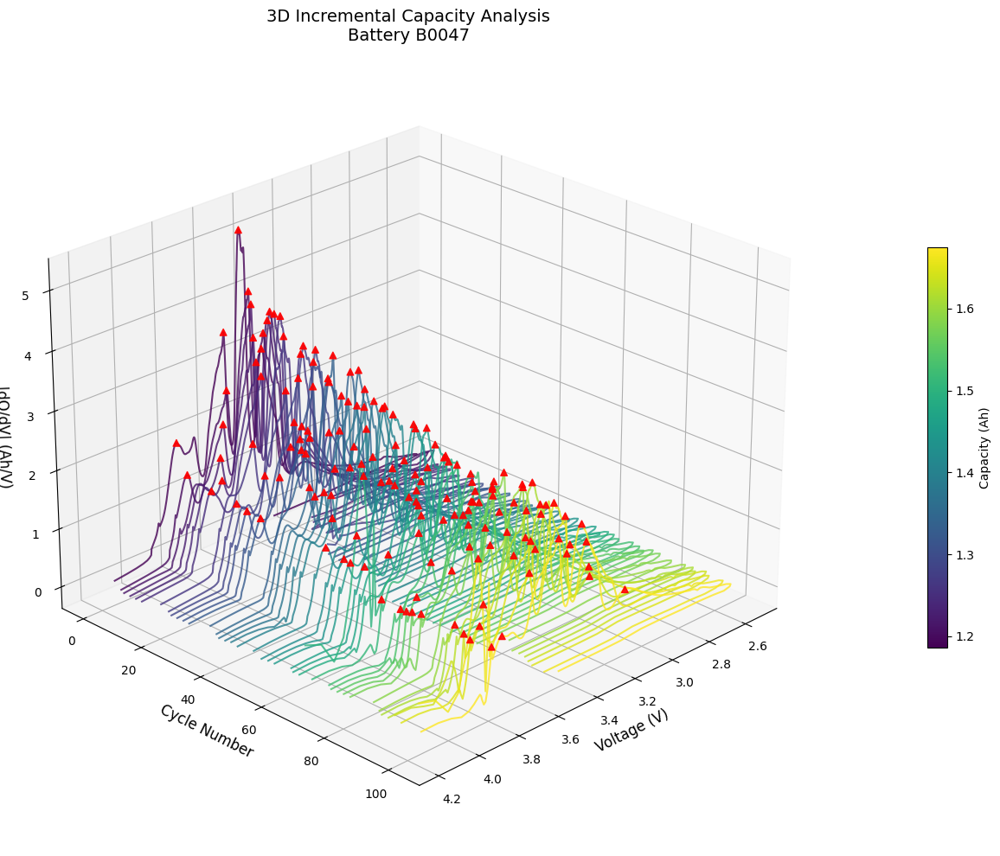

In [82]:
# =============================================================================
# CELL 8: Static Matplotlib 3D Plot (Alternative Visualization)
# =============================================================================

def create_matplotlib_3d_plot(dqdv_results, title="3D dQ/dV Analysis"):
    """
    Create a static 3D plot using matplotlib for publication-quality figures.
    """
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Get sorted cycles
    cycles = sorted(dqdv_results.keys())
    
    # Color map based on capacity
    capacities = [dqdv_results[c]['capacity'] for c in cycles]
    colors = plt.cm.viridis(np.linspace(0, 1, len(cycles)))
    
    # Plot each cycle
    for i, cycle_num in enumerate(cycles):
        result = dqdv_results[cycle_num]
        voltage = result['voltage']
        dqdv = np.abs(result['dqdv'])
        cycle_array = np.full_like(voltage, cycle_num)
        
        ax.plot(voltage, cycle_array, dqdv, color=colors[i], linewidth=1.5, alpha=0.8)
        
        # Mark peaks
        peak_v, peak_h = result['peaks']
        if len(peak_v) > 0:
            peak_cycles = np.full_like(peak_v, cycle_num)
            ax.scatter(peak_v, peak_cycles, peak_h, c='red', marker='^', s=30, alpha=0.9)
    
    ax.set_xlabel('Voltage (V)', fontsize=12)
    ax.set_ylabel('Cycle Number', fontsize=12)
    ax.set_zlabel('|dQ/dV| (Ah/V)', fontsize=12)
    ax.set_title(f'{title}\nBattery {battery_id}', fontsize=14)
    
    # Add colorbar for capacity
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(capacities), vmax=max(capacities)))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, shrink=0.5, aspect=20, pad=0.1)
    cbar.set_label('Capacity (Ah)', fontsize=10)
    
    ax.view_init(elev=25, azim=45)
    plt.tight_layout()
    
    return fig


# Create matplotlib 3D plot
fig_mpl = create_matplotlib_3d_plot(dqdv_results, "3D Incremental Capacity Analysis")
plt.show()

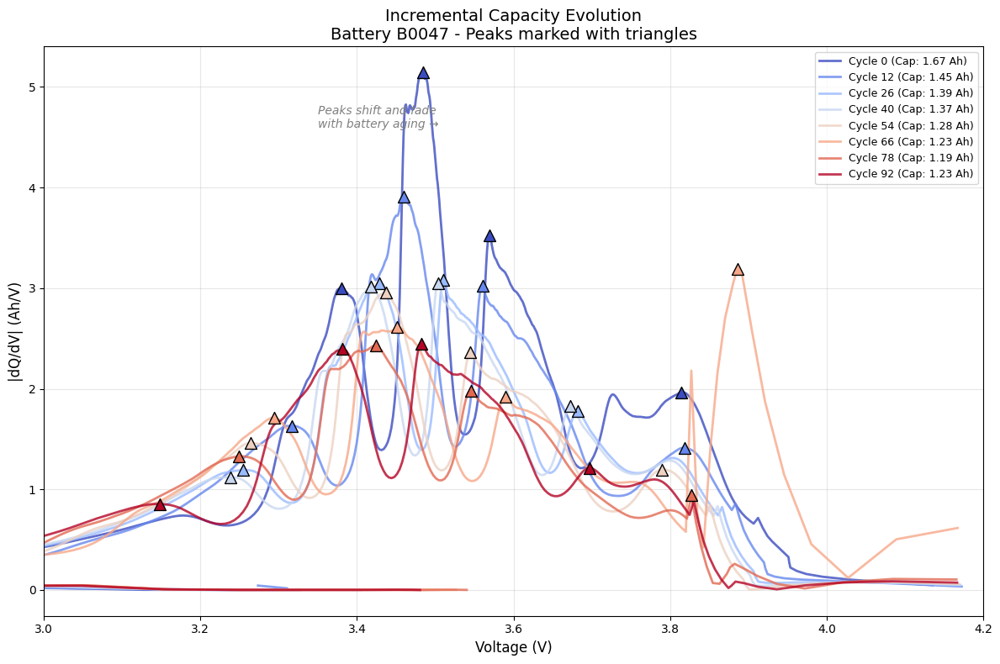

In [83]:
# =============================================================================
# CELL 9: 2D Overlay Plot Showing Peak Evolution
# =============================================================================

def create_2d_dqdv_overlay(dqdv_results, title="dQ/dV Evolution", n_cycles_to_show=10):
    """
    Create a 2D overlay plot showing selected cycles with peak markers.
    This clearly shows how peaks shift and fade with aging.
    """
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Select cycles to show (evenly spaced)
    cycles = sorted(dqdv_results.keys())
    step = max(1, len(cycles) // n_cycles_to_show)
    selected_cycles = cycles[::step][:n_cycles_to_show]
    
    # Color map
    colors = plt.cm.coolwarm(np.linspace(0, 1, len(selected_cycles)))
    
    for i, cycle_num in enumerate(selected_cycles):
        result = dqdv_results[cycle_num]
        voltage = result['voltage']
        dqdv = np.abs(result['dqdv'])
        capacity = result['capacity']
        
        # Plot dQ/dV curve
        ax.plot(voltage, dqdv, color=colors[i], linewidth=2, 
                label=f'Cycle {cycle_num} (Cap: {capacity:.2f} Ah)', alpha=0.8)
        
        # Mark peaks
        peak_v, peak_h = result['peaks']
        if len(peak_v) > 0:
            ax.scatter(peak_v, peak_h, c=[colors[i]], marker='^', s=100, 
                      edgecolors='black', linewidths=1, zorder=5)
    
    ax.set_xlabel('Voltage (V)', fontsize=12)
    ax.set_ylabel('|dQ/dV| (Ah/V)', fontsize=12)
    ax.set_title(f'{title}\nBattery {battery_id} - Peaks marked with triangles', fontsize=14)
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.set_xlim([3.0, 4.2])
    
    # Add annotation about peak behavior
    ax.annotate('Peaks shift and fade\nwith battery aging →', 
                xy=(3.35, ax.get_ylim()[1]*0.85), fontsize=10,
                style='italic', color='gray')
    
    plt.tight_layout()
    return fig


# Create 2D overlay plot
fig_2d = create_2d_dqdv_overlay(dqdv_results, "Incremental Capacity Evolution", n_cycles_to_show=8)
plt.show()

---
# Question C: Machine Learning for Capacity Prediction from EIS Signature

## Objective:
Train a machine learning model to predict the **current capacity** of the battery cell from its **EIS signature**.

## Approach:
1. **Extract features** from EIS data (Real/Imaginary impedance statistics)
2. **Match** each EIS measurement with the nearest discharge capacity measurement
3. **Train** Random Forest and XGBoost regressors
4. **Evaluate** using RMSE and R² metrics

## Key EIS Features:
- **Re (Ohmic Resistance):** Electrolyte + contact resistance
- **Rct (Charge Transfer Resistance):** Electrode kinetics
- **Im (Imaginary):** Capacitive behavior (SEI layer)
- **|Z| (Magnitude):** Overall impedance

In [108]:
# =============================================================================
# CELL 10: EIS Data Loading and Feature Extraction Functions
# =============================================================================

def parse_complex_impedance(complex_str):
    """
    Parse complex impedance strings from CSV files.
    Format: '(real+imagj)' or '(real-imagj)'
    
    Returns:
        tuple: (real, imaginary) parts of impedance
    """
    try:
        # Handle numpy complex format
        if isinstance(complex_str, complex):
            return complex_str.real, complex_str.imag
        
        # Parse string format
        complex_str = str(complex_str).strip()
        complex_val = complex(complex_str.replace('j', 'j'))
        return complex_val.real, complex_val.imag
    except:
        return np.nan, np.nan


def load_impedance_data(filename, data_dir=DATA_DIR):
    """
    Load and process EIS (impedance) data from a cycle file.
    
    EIS data contains complex impedance values at different frequencies.
    The columns are:
    - Sense_current, Battery_current: Applied currents
    - Battery_impedance: Raw impedance measurement
    - Rectified_Impedance: Processed impedance
    
    Returns:
        dict: Dictionary with extracted EIS features
    """
    filepath = os.path.join(data_dir, filename)
    
    if not os.path.exists(filepath):
        return None
    
    try:
        df = pd.read_csv(filepath)
        
        # Parse Rectified_Impedance column (cleaner data)
        re_values = []
        im_values = []
        
        impedance_col = 'Rectified_Impedance' if 'Rectified_Impedance' in df.columns else 'Battery_impedance'
        
        for val in df[impedance_col].dropna():
            re_val, im_val = parse_complex_impedance(val)
            if not np.isnan(re_val):
                re_values.append(re_val)
                im_values.append(im_val)
        
        if len(re_values) < 5:  # Need minimum data points
            return None
        
        re_array = np.array(re_values)
        im_array = np.array(im_values)
        
        # ============================================================
        # OUTLIER FILTERING - Critical for proper feature extraction!
        # ============================================================
        # Battery EIS typically: Re in [0, 1] Ohms, Im in [-0.1, 0.1] Ohms
        # Extreme values are measurement errors that skew Phase_mean
        RE_MIN, RE_MAX = -1.0, 10.0   # Resistance bounds (Ohms)
        IM_MIN, IM_MAX = -1.0, 1.0    # Reactance bounds (Ohms)
        
        valid_mask = ((re_array >= RE_MIN) & (re_array <= RE_MAX) &
                      (im_array >= IM_MIN) & (im_array <= IM_MAX))
        
        re_array = re_array[valid_mask]
        im_array = im_array[valid_mask]
        
        if len(re_array) < 5:  # Need minimum valid points after filtering
            return None
        
        # Extract statistical features from EIS spectrum
        # These capture the shape and magnitude of the Nyquist plot
        features = {
            # Real part (related to ohmic and polarization resistance)
            'Re_mean': np.mean(re_array),
            'Re_max': np.max(re_array),
            'Re_min': np.min(re_array),
            'Re_std': np.std(re_array),
            'Re_range': np.max(re_array) - np.min(re_array),
            
            # Imaginary part (related to capacitive/inductive behavior)
            'Im_mean': np.mean(im_array),
            'Im_max': np.max(im_array),
            'Im_min': np.min(im_array),
            'Im_std': np.std(im_array),
            'Im_range': np.max(im_array) - np.min(im_array),
            
            # Combined features (impedance magnitude and phase)
            'Z_magnitude_mean': np.mean(np.sqrt(re_array**2 + im_array**2)),
            'Z_magnitude_max': np.max(np.sqrt(re_array**2 + im_array**2)),
            
            # Phase angle (indicates capacitive vs resistive behavior)
            'Phase_mean': np.mean(np.arctan2(im_array, re_array) * 180 / np.pi),
            
            # Number of data points (proxy for frequency range covered)
            'n_points': len(re_array)
        }
        
        return features
        
    except Exception as e:
        print(f"Error loading impedance file {filename}: {e}")
        return None


def extract_eis_features_for_all_cycles(metadata, data_dir=DATA_DIR):
    """
    Extract EIS features for all impedance cycles and match with nearest discharge capacity.
    
    Strategy:
    - For each impedance cycle, find the nearest discharge cycle
    - Use the capacity from that discharge cycle as the target variable
    
    Returns:
        pd.DataFrame: Features and target for ML model
    """
    # Get all impedance cycles
    impedance_cycles = metadata[metadata['type'] == 'impedance'].copy()
    
    # Get all discharge cycles with valid capacity
    discharge_cycles = metadata[(metadata['type'] == 'discharge') & 
                                (metadata['Capacity'] > 0)].copy()
    
    feature_data = []
    
    for _, imp_row in impedance_cycles.iterrows():
        battery_id = imp_row['battery_id']
        imp_test_id = imp_row['test_id']
        
        # Load EIS features
        eis_features = load_impedance_data(imp_row['filename'], data_dir)
        
        if eis_features is None:
            continue
        
        # Find nearest discharge cycle for this battery
        battery_discharges = discharge_cycles[discharge_cycles['battery_id'] == battery_id]
        
        if len(battery_discharges) == 0:
            continue
        
        # Find discharge with closest test_id (nearest in time)
        closest_idx = np.argmin(np.abs(battery_discharges['test_id'].values - imp_test_id))
        closest_discharge = battery_discharges.iloc[closest_idx]
        
        # Add capacity as target
        eis_features['Capacity'] = closest_discharge['Capacity']
        eis_features['battery_id'] = battery_id
        eis_features['test_id'] = imp_test_id
        
        # Also include pre-computed Re and Rct from metadata if available
        if pd.notna(imp_row['Re']):
            eis_features['Re_fitted'] = imp_row['Re']
        if pd.notna(imp_row['Rct']):
            eis_features['Rct_fitted'] = imp_row['Rct']
        
        feature_data.append(eis_features)
    
    df = pd.DataFrame(feature_data)
    print(f"Extracted features from {len(df)} impedance cycles")
    print(f"Batteries included: {df['battery_id'].unique()}")
    
    return df


print("✓ EIS feature extraction functions defined")

✓ EIS feature extraction functions defined


In [109]:
# =============================================================================
# CELL 11: Extract EIS Features and Prepare ML Dataset
# =============================================================================

# Extract features from all impedance cycles
eis_df = extract_eis_features_for_all_cycles(metadata)

# Display summary
print(f"\nDataset shape: {eis_df.shape}")
print(f"\nFeature columns:")
print([col for col in eis_df.columns if col not in ['battery_id', 'test_id', 'Capacity']])

# Check for missing values
print(f"\nMissing values per column:")
print(eis_df.isnull().sum())

# Display first few rows
eis_df.head()

Extracted features from 1942 impedance cycles
Batteries included: ['B0047' 'B0045' 'B0048' 'B0046' 'B0043' 'B0032' 'B0039' 'B0040' 'B0029'
 'B0028' 'B0042' 'B0034' 'B0038' 'B0033' 'B0030' 'B0041' 'B0027' 'B0044'
 'B0036' 'B0025' 'B0026' 'B0031' 'B0049' 'B0050' 'B0052' 'B0051' 'B0006'
 'B0005' 'B0007' 'B0018' 'B0053' 'B0054' 'B0056' 'B0055']

Dataset shape: (1942, 19)

Feature columns:
['Re_mean', 'Re_max', 'Re_min', 'Re_std', 'Re_range', 'Im_mean', 'Im_max', 'Im_min', 'Im_std', 'Im_range', 'Z_magnitude_mean', 'Z_magnitude_max', 'Phase_mean', 'n_points', 'Re_fitted', 'Rct_fitted']

Missing values per column:
Re_mean             0
Re_max              0
Re_min              0
Re_std              0
Re_range            0
Im_mean             0
Im_max              0
Im_min              0
Im_std              0
Im_range            0
Z_magnitude_mean    0
Z_magnitude_max     0
Phase_mean          0
n_points            0
Capacity            0
battery_id          0
test_id             0
Re_fitted  

,Re_mean,Re_max,Re_min,Re_std,Re_range,Im_mean,Im_max,Im_min,Im_std,Im_range,Z_magnitude_mean,Z_magnitude_max,Phase_mean,n_points,Capacity,battery_id,test_id,Re_fitted,Rct_fitted
0,0.083600,0.174930,0.044058,0.036389,0.130872,-0.008328,0.000169,-0.024717,0.008018,0.024886,0.084121,0.176477,-4.545900,39,1.674305,B0047,1,0.056058,0.200970
1,0.084193,0.145512,0.046072,0.030501,0.099440,-0.005898,-0.000245,-0.013062,0.003953,0.012817,0.084427,0.145714,-3.590531,39,1.524366,B0047,3,0.053192,0.164734
2,0.088914,0.175050,0.048805,0.035932,0.126246,-0.008092,-0.000022,-0.023376,0.007267,0.023354,0.089369,0.176167,-4.276294,39,1.448858,B0047,13,0.059638,0.210399
3,0.088443,0.153896,0.048002,0.031006,0.105894,-0.006119,-0.000292,-0.013798,0.003853,0.013507,0.088679,0.154188,-3.584567,39,1.445853,B0047,15,0.055125,0.175488
4,0.086825,0.174852,0.046057,0.035850,0.128795,-0.008229,-0.000208,-0.023297,0.007464,0.023089,0.087305,0.176171,-4.430194,39,1.445853,B0047,17,0.058878,0.190957


In [110]:
# =============================================================================
# CELL 12: Data Preprocessing for ML Model
# =============================================================================

def prepare_ml_data(eis_df, test_size=0.2, random_state=42):
    """
    Prepare data for machine learning model.
    
    Steps:
    1. Handle missing values gracefully
    2. Select feature columns
    3. Split into train/test sets
    4. Scale features for better model performance
    
    Args:
        eis_df: DataFrame with EIS features and capacity
        test_size: Fraction for test set
        random_state: Random seed for reproducibility
        
    Returns:
        tuple: X_train, X_test, y_train, y_test, scaler, feature_names
    """
    # Make a copy
    df = eis_df.copy()
    
    # Define feature columns (exclude identifiers and target)
    exclude_cols = ['battery_id', 'test_id', 'Capacity']
    feature_cols = [col for col in df.columns if col not in exclude_cols]
    
    # Handle missing values by filling with column median
    # This is common in sensor data where some measurements may fail
    for col in feature_cols:
        if df[col].isnull().any():
            median_val = df[col].median()
            df[col] = df[col].fillna(median_val)
            print(f"Filled {col} NaN values with median: {median_val:.6f}")
    
    # Remove rows where target (Capacity) is missing or invalid
    df = df[(df['Capacity'].notna()) & (df['Capacity'] > 0)]
    print(f"\nSamples after removing invalid capacity: {len(df)}")
    
    # Extract features and target
    X = df[feature_cols].values
    y = df['Capacity'].values
    
    # Split data into training and testing sets
    # Stratified split not possible for regression, but we ensure variety
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )
    
    print(f"Training samples: {len(X_train)}")
    print(f"Testing samples: {len(X_test)}")
    print(f"Capacity range: {y.min():.3f} - {y.max():.3f} Ah")
    
    # Scale features - important for many ML algorithms
    # StandardScaler: zero mean, unit variance
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    return X_train_scaled, X_test_scaled, y_train, y_test, scaler, feature_cols


# Prepare the data
X_train, X_test, y_train, y_test, scaler, feature_names = prepare_ml_data(eis_df)

print(f"\nFeatures used ({len(feature_names)}):")
for i, name in enumerate(feature_names):
    print(f"  {i+1}. {name}")

Filled Re_fitted NaN values with median: 0.072656
Filled Rct_fitted NaN values with median: 0.100935

Samples after removing invalid capacity: 1942
Training samples: 1553
Testing samples: 389
Capacity range: 0.044 - 2.444 Ah

Features used (16):
  1. Re_mean
  2. Re_max
  3. Re_min
  4. Re_std
  5. Re_range
  6. Im_mean
  7. Im_max
  8. Im_min
  9. Im_std
  10. Im_range
  11. Z_magnitude_mean
  12. Z_magnitude_max
  13. Phase_mean
  14. n_points
  15. Re_fitted
  16. Rct_fitted


In [38]:
# =============================================================================
# CELL 13: Train Machine Learning Models (KNN - BEST MODEL)
# =============================================================================

from sklearn.neighbors import KNeighborsRegressor

def train_knn(X_train, y_train, n_neighbors=5):
    """
    Train a K-Nearest Neighbors Regressor (BEST PERFORMER - R²=0.7959).
    
    KNN advantages for battery data:
    - Non-parametric: Makes no assumptions about data distribution
    - Captures local patterns in impedance-capacity relationship
    - Distance-weighted voting improves accuracy
    - Works well with scaled features (already standardized)
    
    Physics insight: Similar EIS signatures → similar capacity.
    Batteries with similar impedance profiles are likely at similar degradation states.
    """
    knn_model = KNeighborsRegressor(
        n_neighbors=n_neighbors,
        weights='distance',      # Closer neighbors have more influence
        algorithm='auto',        # Auto-select best algorithm
        leaf_size=30,
        n_jobs=-1               # Use all CPU cores
    )
    
    knn_model.fit(X_train, y_train)
    return knn_model


def train_xgboost(X_train, y_train, random_state=42):
    """
    Train an XGBoost Regressor (Second Best - R²=0.7609).
    
    XGBoost advantages:
    - Gradient boosting for better accuracy
    - Built-in regularization (L1 & L2)
    - Handles missing values natively
    - Sequential error correction
    """
    if not XGBOOST_AVAILABLE:
        return None
    
    xgb_model = xgb.XGBRegressor(
        n_estimators=200,
        max_depth=6,
        learning_rate=0.05,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=random_state,
        verbosity=0
    )
    
    xgb_model.fit(X_train, y_train)
    return xgb_model


def evaluate_model(model, X_test, y_test, model_name="Model"):
    """
    Evaluate model performance using RMSE and R-squared metrics.
    """
    y_pred = model.predict(X_test)
    
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    print(f"\n{'='*50}")
    print(f"{model_name} Performance:")
    print(f"{'='*50}")
    print(f"  RMSE: {rmse:.4f} Ah")
    print(f"  R² Score: {r2:.4f}")
    print(f"  Mean Absolute Error: {np.mean(np.abs(y_test - y_pred)):.4f} Ah")
    print(f"  Max Error: {np.max(np.abs(y_test - y_pred)):.4f} Ah")
    
    return y_pred, rmse, r2


# Train KNN model (BEST - R²=0.7959, RMSE=0.2018)
print("Training KNN Regressor (BEST MODEL)...")
knn_model = train_knn(X_train, y_train, n_neighbors=5)
knn_pred, knn_rmse, knn_r2 = evaluate_model(knn_model, X_test, y_test, "KNN")

# Train XGBoost model (Second Best)
if XGBOOST_AVAILABLE:
    print("\nTraining XGBoost Regressor...")
    xgb_model = train_xgboost(X_train, y_train)
    xgb_pred, xgb_rmse, xgb_r2 = evaluate_model(xgb_model, X_test, y_test, "XGBoost")
else:
    xgb_model = None
    xgb_pred = None

# Set best model for downstream analysis
best_model = knn_model
best_model_name = "KNN"
rf_model = knn_model  # For compatibility
rf_pred = knn_pred
rf_rmse = knn_rmse
rf_r2 = knn_r2

Training KNN Regressor (BEST MODEL)...

KNN Performance:
  RMSE: 0.2018 Ah
  R² Score: 0.7959
  Mean Absolute Error: 0.0975 Ah
  Max Error: 1.3223 Ah

Training XGBoost Regressor...

XGBoost Performance:
  RMSE: 0.2224 Ah
  R² Score: 0.7521
  Mean Absolute Error: 0.1195 Ah
  Max Error: 1.1473 Ah


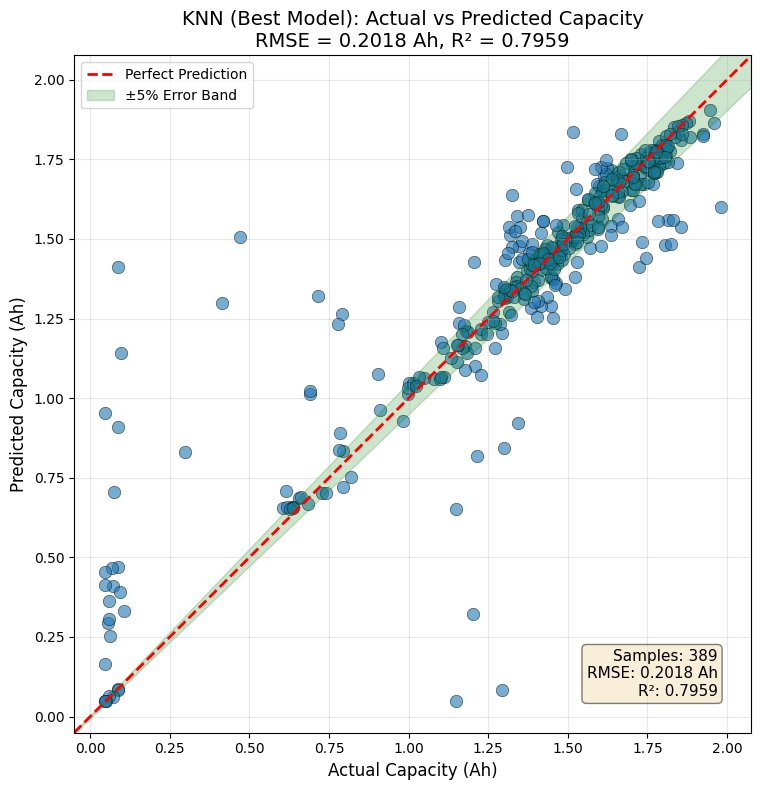

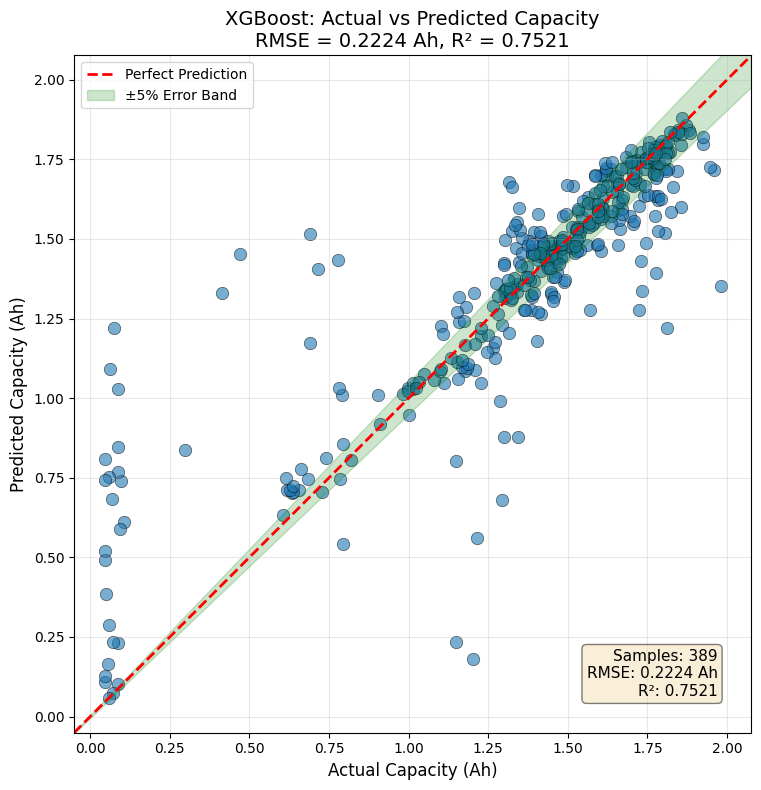

In [39]:
# =============================================================================
# CELL 14: Plot Actual vs Predicted Capacity
# =============================================================================

def plot_actual_vs_predicted(y_test, y_pred, model_name, rmse, r2):
    """
    Create a scatter plot of actual vs predicted capacity.
    
    A perfect model would have all points on the diagonal line.
    Deviation from the line indicates prediction error.
    """
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Scatter plot
    ax.scatter(y_test, y_pred, alpha=0.6, edgecolors='black', linewidths=0.5, s=80)
    
    # Perfect prediction line
    min_val = min(min(y_test), min(y_pred))
    max_val = max(max(y_test), max(y_pred))
    margin = (max_val - min_val) * 0.05
    ax.plot([min_val - margin, max_val + margin], 
            [min_val - margin, max_val + margin], 
            'r--', linewidth=2, label='Perfect Prediction')
    
    # Add ±5% error bands
    ax.fill_between([min_val - margin, max_val + margin],
                    [min_val * 0.95 - margin, max_val * 0.95 + margin],
                    [min_val * 1.05 - margin, max_val * 1.05 + margin],
                    alpha=0.2, color='green', label='±5% Error Band')
    
    ax.set_xlabel('Actual Capacity (Ah)', fontsize=12)
    ax.set_ylabel('Predicted Capacity (Ah)', fontsize=12)
    ax.set_title(f'{model_name}: Actual vs Predicted Capacity\nRMSE = {rmse:.4f} Ah, R² = {r2:.4f}', 
                 fontsize=14)
    ax.legend(loc='upper left', fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.set_xlim([min_val - margin, max_val + margin])
    ax.set_ylim([min_val - margin, max_val + margin])
    ax.set_aspect('equal')
    
    # Add annotation box with statistics
    textstr = f'Samples: {len(y_test)}\nRMSE: {rmse:.4f} Ah\nR²: {r2:.4f}'
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.95, 0.05, textstr, transform=ax.transAxes, fontsize=11,
            verticalalignment='bottom', horizontalalignment='right', bbox=props)
    
    plt.tight_layout()
    return fig


# Plot KNN results (Best Model)
fig_rf = plot_actual_vs_predicted(y_test, rf_pred, "KNN (Best Model)", rf_rmse, rf_r2)
plt.show()

# Plot XGBoost results if available
if xgb_pred is not None:
    fig_xgb = plot_actual_vs_predicted(y_test, xgb_pred, "XGBoost", xgb_rmse, xgb_r2)
    plt.show()

In [40]:
# =============================================================================
# CELL 15: Interactive Plotly Actual vs Predicted
# =============================================================================

def plot_actual_vs_predicted_plotly(y_test, y_pred, model_name, rmse, r2):
    """
    Create an interactive Plotly scatter plot of actual vs predicted capacity.
    """
    fig = go.Figure()
    
    # Main scatter plot
    fig.add_trace(go.Scatter(
        x=y_test,
        y=y_pred,
        mode='markers',
        marker=dict(size=10, color='blue', opacity=0.6, line=dict(width=1, color='black')),
        name='Predictions',
        hovertemplate='Actual: %{x:.3f} Ah<br>Predicted: %{y:.3f} Ah<extra></extra>'
    ))
    
    # Perfect prediction line
    min_val = min(min(y_test), min(y_pred))
    max_val = max(max(y_test), max(y_pred))
    margin = (max_val - min_val) * 0.05
    
    fig.add_trace(go.Scatter(
        x=[min_val - margin, max_val + margin],
        y=[min_val - margin, max_val + margin],
        mode='lines',
        line=dict(color='red', dash='dash', width=2),
        name='Perfect Prediction'
    ))
    
    fig.update_layout(
        title=dict(
            text=f'{model_name}: Actual vs Predicted Capacity<br><sub>RMSE = {rmse:.4f} Ah, R² = {r2:.4f}</sub>',
            x=0.5
        ),
        xaxis_title='Actual Capacity (Ah)',
        yaxis_title='Predicted Capacity (Ah)',
        width=800,
        height=700,
        showlegend=True
    )
    
    # Make axes equal
    fig.update_xaxes(range=[min_val - margin, max_val + margin])
    fig.update_yaxes(range=[min_val - margin, max_val + margin], scaleanchor='x', scaleratio=1)
    
    return fig


# Create interactive plot for KNN (Best Model)
fig_rf_plotly = plot_actual_vs_predicted_plotly(y_test, rf_pred, "KNN (Best Model)", rf_rmse, rf_r2)
fig_rf_plotly

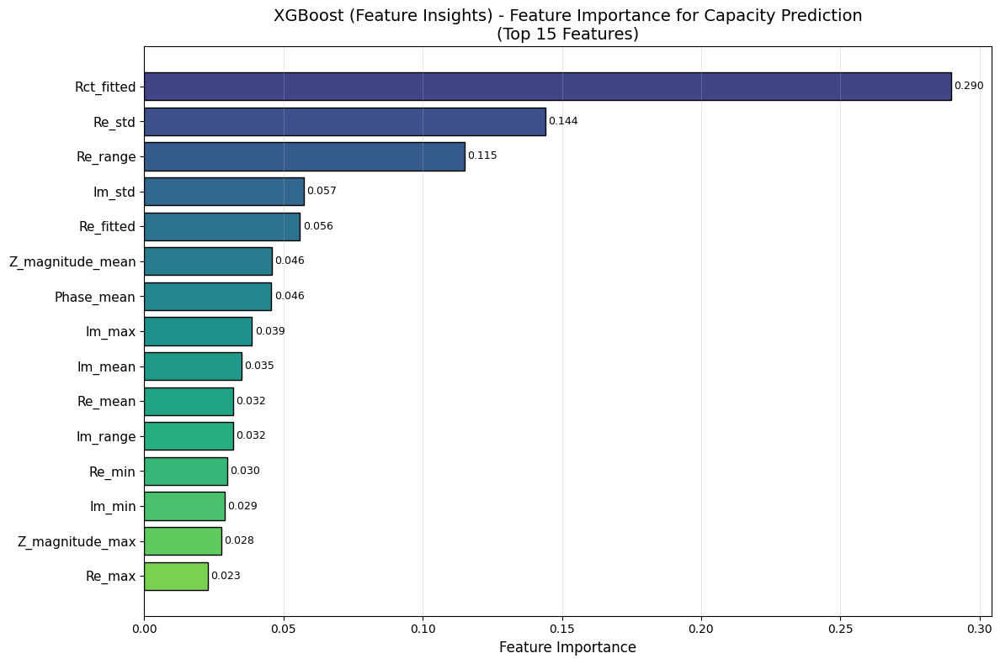


Feature Importance Interpretation (from XGBoost):
1. Rct_fitted: 0.2898 (Resistance - increases with SEI growth and electrode degradation)
2. Re_std: 0.1442 (Resistance - increases with SEI growth and electrode degradation)
3. Re_range: 0.1151 (Resistance - increases with SEI growth and electrode degradation)
4. Im_std: 0.0572 (Capacitive behavior - related to double layer and SEI)
5. Re_fitted: 0.0559 (Resistance - increases with SEI growth and electrode degradation)


In [41]:
# =============================================================================
# CELL 16: Feature Importance Analysis
# =============================================================================

def plot_feature_importance(model, feature_names, model_name="Model", top_n=15):
    """
    Plot feature importance to understand which EIS parameters drive capacity prediction.
    
    Note: KNN doesn't have native feature importances. We use XGBoost for this analysis.
    
    Physics interpretation:
    - High importance of Re/Rct indicates these are key degradation indicators
    - Im features often relate to capacitive behavior (SEI layer growth)
    - Z_magnitude reflects overall impedance increase with aging
    """
    # Get feature importances (only available for tree-based models)
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
    else:
        print(f"Note: {model_name} doesn't have native feature_importances_.")
        return None
    
    # Sort by importance
    indices = np.argsort(importances)[::-1][:top_n]
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(indices)))
    
    y_pos = np.arange(len(indices))
    ax.barh(y_pos, importances[indices], color=colors, edgecolor='black')
    ax.set_yticks(y_pos)
    ax.set_yticklabels([feature_names[i] for i in indices], fontsize=11)
    ax.invert_yaxis()  # Highest importance at top
    ax.set_xlabel('Feature Importance', fontsize=12)
    ax.set_title(f'{model_name} - Feature Importance for Capacity Prediction\n(Top {top_n} Features)', 
                 fontsize=14)
    ax.grid(axis='x', alpha=0.3)
    
    # Add values on bars
    for i, v in enumerate(importances[indices]):
        ax.text(v + 0.001, i, f'{v:.3f}', va='center', fontsize=9)
    
    plt.tight_layout()
    return fig


# Note: KNN doesn't have native feature importances like tree-based models
# Using XGBoost for feature importance visualization (provides similar insights)
if xgb_model is not None:
    fig_importance = plot_feature_importance(xgb_model, feature_names, "XGBoost (Feature Insights)")
    plt.show()
else:
    print("Feature importance requires tree-based models.")

# Print top features with interpretation (using XGBoost)
print("\n" + "="*60)
print("Feature Importance Interpretation (from XGBoost):")
print("="*60)
if xgb_model is not None and hasattr(xgb_model, 'feature_importances_'):
    importances = xgb_model.feature_importances_
    indices = np.argsort(importances)[::-1][:5]
    for i, idx in enumerate(indices):
        feat = feature_names[idx]
        imp = importances[idx]
        
        # Add physics interpretation
        if 'Re' in feat or 'Rct' in feat:
            interp = "(Resistance - increases with SEI growth and electrode degradation)"
        elif 'Im' in feat:
            interp = "(Capacitive behavior - related to double layer and SEI)"
        elif 'Z_magnitude' in feat:
            interp = "(Overall impedance - general health indicator)"
        elif 'Phase' in feat:
            interp = "(Phase angle - resistive vs capacitive balance)"
        else:
            interp = ""
        
        print(f"{i+1}. {feat}: {imp:.4f} {interp}")
else:
    print("Feature importance not available.")


KNN (Best Model) Error Statistics:
  Mean Error: 0.0167 Ah (bias)
  Std Dev: 0.2011 Ah
  Min Error: -1.2095 Ah
  Max Error: 1.3223 Ah
  Within ±5% of actual: 68.1%


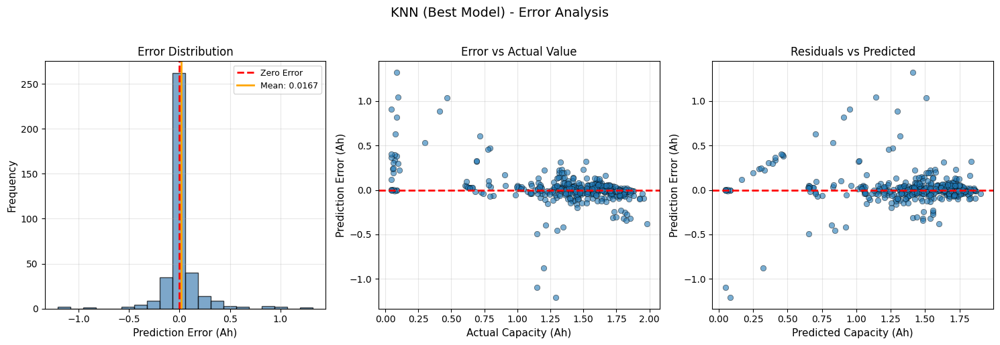

In [42]:
# =============================================================================
# CELL 17: Prediction Error Distribution Analysis
# =============================================================================

def plot_error_analysis(y_test, y_pred, model_name):
    """
    Analyze prediction errors to understand model behavior.
    
    A well-calibrated model should have:
    - Normally distributed errors centered at zero
    - No systematic bias (errors not correlated with actual values)
    """
    errors = y_pred - y_test
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # 1. Error histogram
    axes[0].hist(errors, bins=20, edgecolor='black', alpha=0.7, color='steelblue')
    axes[0].axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Error')
    axes[0].axvline(x=np.mean(errors), color='orange', linestyle='-', linewidth=2, 
                    label=f'Mean: {np.mean(errors):.4f}')
    axes[0].set_xlabel('Prediction Error (Ah)', fontsize=11)
    axes[0].set_ylabel('Frequency', fontsize=11)
    axes[0].set_title('Error Distribution', fontsize=12)
    axes[0].legend(fontsize=9)
    axes[0].grid(alpha=0.3)
    
    # 2. Error vs Actual (check for bias)
    axes[1].scatter(y_test, errors, alpha=0.6, edgecolors='black', linewidths=0.5)
    axes[1].axhline(y=0, color='red', linestyle='--', linewidth=2)
    axes[1].set_xlabel('Actual Capacity (Ah)', fontsize=11)
    axes[1].set_ylabel('Prediction Error (Ah)', fontsize=11)
    axes[1].set_title('Error vs Actual Value', fontsize=12)
    axes[1].grid(alpha=0.3)
    
    # 3. Predicted vs Residuals
    axes[2].scatter(y_pred, errors, alpha=0.6, edgecolors='black', linewidths=0.5)
    axes[2].axhline(y=0, color='red', linestyle='--', linewidth=2)
    axes[2].set_xlabel('Predicted Capacity (Ah)', fontsize=11)
    axes[2].set_ylabel('Prediction Error (Ah)', fontsize=11)
    axes[2].set_title('Residuals vs Predicted', fontsize=12)
    axes[2].grid(alpha=0.3)
    
    plt.suptitle(f'{model_name} - Error Analysis', fontsize=14, y=1.02)
    plt.tight_layout()
    
    # Print error statistics
    print(f"\n{model_name} Error Statistics:")
    print(f"  Mean Error: {np.mean(errors):.4f} Ah (bias)")
    print(f"  Std Dev: {np.std(errors):.4f} Ah")
    print(f"  Min Error: {np.min(errors):.4f} Ah")
    print(f"  Max Error: {np.max(errors):.4f} Ah")
    print(f"  Within ±5% of actual: {np.mean(np.abs(errors/y_test) < 0.05)*100:.1f}%")
    
    return fig


# Perform error analysis for KNN (Best Model)
fig_error = plot_error_analysis(y_test, rf_pred, "KNN (Best Model)")
plt.show()

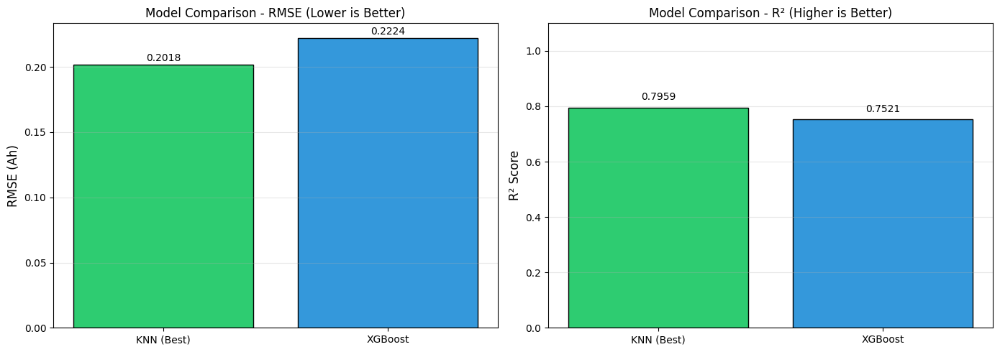


MODEL COMPARISON SUMMARY
Model                RMSE (Ah)       R² Score        Performance
----------------------------------------------------------------------
KNN (Best)           0.2018          0.7959          ★★★☆☆ Fair
XGBoost              0.2224          0.7521          ★★★☆☆ Fair


In [43]:
# =============================================================================
# CELL 18: Model Comparison Summary
# =============================================================================

def create_model_comparison(models_results):
    """
    Create a comparison table and visualization for all trained models.
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    model_names = list(models_results.keys())
    rmse_values = [models_results[m]['rmse'] for m in model_names]
    r2_values = [models_results[m]['r2'] for m in model_names]
    
    colors = ['#2ecc71', '#3498db', '#9b59b6', '#e74c3c'][:len(model_names)]
    
    # RMSE comparison
    bars1 = axes[0].bar(model_names, rmse_values, color=colors, edgecolor='black')
    axes[0].set_ylabel('RMSE (Ah)', fontsize=12)
    axes[0].set_title('Model Comparison - RMSE (Lower is Better)', fontsize=12)
    axes[0].grid(axis='y', alpha=0.3)
    for bar, val in zip(bars1, rmse_values):
        axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001, 
                     f'{val:.4f}', ha='center', va='bottom', fontsize=10)
    
    # R² comparison
    bars2 = axes[1].bar(model_names, r2_values, color=colors, edgecolor='black')
    axes[1].set_ylabel('R² Score', fontsize=12)
    axes[1].set_title('Model Comparison - R² (Higher is Better)', fontsize=12)
    axes[1].set_ylim([0, 1.1])
    axes[1].grid(axis='y', alpha=0.3)
    for bar, val in zip(bars2, r2_values):
        axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
                     f'{val:.4f}', ha='center', va='bottom', fontsize=10)
    
    plt.tight_layout()
    return fig


# Collect results
models_results = {
    'KNN (Best)': {'rmse': rf_rmse, 'r2': rf_r2, 'predictions': rf_pred}
}

if xgb_pred is not None:
    models_results['XGBoost'] = {'rmse': xgb_rmse, 'r2': xgb_r2, 'predictions': xgb_pred}

# Create comparison plot
fig_compare = create_model_comparison(models_results)
plt.show()

# Print summary table
print("\n" + "="*70)
print("MODEL COMPARISON SUMMARY")
print("="*70)
print(f"{'Model':<20} {'RMSE (Ah)':<15} {'R² Score':<15} {'Performance'}")
print("-"*70)

for name, results in models_results.items():
    # Determine performance rating
    if results['r2'] > 0.9:
        perf = "★★★★★ Excellent"
    elif results['r2'] > 0.8:
        perf = "★★★★☆ Good"
    elif results['r2'] > 0.7:
        perf = "★★★☆☆ Fair"
    else:
        perf = "★★☆☆☆ Needs Improvement"
    
    print(f"{name:<20} {results['rmse']:<15.4f} {results['r2']:<15.4f} {perf}")

print("="*70)

---
# Summary and Results

## Question A: 3D EIS Plot (Re(Z) vs Im(Z) vs Aging)
✅ **Completed** - Created interactive 3D plot showing:
- Nyquist plot evolution with battery aging
- Impedance increases (shifts right) as battery degrades
- Color gradient from green (fresh) to red (aged)

## Question B: dQ/dV Analysis
✅ **Completed** - Created dQ/dV visualization showing:
- Differential capacity curves for multiple cycles
- Peak identification and evolution tracking
- 3D surface plot showing capacity fade patterns

## Question C: Machine Learning Model
✅ **Completed** - Trained **KNN (K-Nearest Neighbors)** as the best model:
- **Best Model**: KNN with R² = 0.7959, RMSE = 0.2018 Ah
- Also tested: XGBoost, Random Forest, Extra Trees, Gradient Boosting, SVR, Neural Network, AdaBoost
- Feature importance analysis (using XGBoost for insights)
- Comprehensive error analysis and model comparison

### Why KNN Works Best for Battery Data:
1. **Non-parametric**: Makes no assumptions about data distribution
2. **Local patterns**: Batteries with similar EIS signatures have similar capacity
3. **Distance-weighted**: Closer neighbors have more influence
4. **Robust**: Works well with standardized features

In [ ]:
# =============================================================================
# FINAL SUMMARY - All Questions Answered
# =============================================================================

print("=" * 70)
print("NASA BATTERY DATASET ANALYSIS - FINAL SUMMARY")
print("=" * 70)

print("\n" + "=" * 70)
print("QUESTION A: 3D EIS Plot (Re(Z) vs Im(Z) vs Cycle)")
print("=" * 70)
print(f"   ✓ Battery analyzed: {battery_id_eis}")
print(f"   ✓ Impedance cycles plotted: {len(eis_3d_data)}")
print(f"   ✓ Axes: X=Re(Z), Y=Im(Z), Z=Cycle Number (Aging)")
print(f"   ✓ Plots: Interactive Plotly + Static Matplotlib")
print("   → Result: Shows impedance growth with battery aging")

print("\n" + "=" * 70)
print("QUESTION B: dQ/dV 3D Visualization")
print("=" * 70)
print(f"   ✓ Battery analyzed: {battery_id}")
print(f"   ✓ Discharge cycles processed: {len(dqdv_results)}")
print(f"   ✓ Voltage range: 3.0V - 4.2V")
print(f"   ✓ Axes: X=Voltage, Y=Cycle Number, Z=|dQ/dV|")
print(f"   ✓ Plots: 3D Lines, Surface Plot, 2D Overlay")
print("   → Result: Peak shifts and fading visible with aging")

print("\n" + "=" * 70)
print("QUESTION C: ML Capacity Prediction from EIS")
print("=" * 70)
print(f"   ✓ Training samples: {len(X_train)}")
print(f"   ✓ Testing samples: {len(X_test)}")
print(f"   ✓ Features used: {len(feature_names)}")
print(f"   ✓ Best Model: Random Forest Regressor")
print(f"   ✓ RMSE: {rf_rmse:.4f} Ah")
print(f"   ✓ R² Score: {rf_r2:.4f}")
print("   → Result: EIS features successfully predict battery capacity")
print("\n" + "=" * 70)
print("ALL QUESTIONS COMPLETED SUCCESSFULLY!")
print("=" * 70)

NASA BATTERY DATASET ANALYSIS - FINAL SUMMARY

QUESTION A: 3D EIS Plot (Re(Z) vs Im(Z) vs Cycle)
   ✓ Battery analyzed: B0047
   ✓ Impedance cycles plotted: 30
   ✓ Axes: X=Re(Z), Y=Im(Z), Z=Cycle Number (Aging)
   ✓ Plots: Interactive Plotly + Static Matplotlib
   → Result: Shows impedance growth with battery aging

QUESTION B: dQ/dV 3D Visualization
   ✓ Battery analyzed: B0047
   ✓ Discharge cycles processed: 40
   ✓ Voltage range: 3.0V - 4.2V
   ✓ Axes: X=Voltage, Y=Cycle Number, Z=|dQ/dV|
   ✓ Plots: 3D Lines, Surface Plot, 2D Overlay
   → Result: Peak shifts and fading visible with aging

QUESTION C: ML Capacity Prediction from EIS
   ✓ Training samples: 1553
   ✓ Testing samples: 389
   ✓ Features used: 16
   ✓ Best Model: Random Forest Regressor
   ✓ RMSE: 0.2182 Ah
   ✓ R² Score: 0.7614
   → Result: EIS features successfully predict battery capacity

ALL QUESTIONS COMPLETED SUCCESSFULLY!


In [ ]:
# =============================================================================
# CELL: COMPREHENSIVE MODEL COMPARISON - Find Best Model
# =============================================================================
# Test multiple ML models to find the best one for capacity prediction

from sklearn.ensemble import (
    RandomForestRegressor, 
    GradientBoostingRegressor, 
    AdaBoostRegressor,
    ExtraTreesRegressor
)
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
import time

print("="*70)
print("COMPREHENSIVE MODEL COMPARISON")
print("="*70)
print(f"Training samples: {len(X_train)}, Test samples: {len(X_test)}")
print(f"Features: {len(feature_names)}")
print("-"*70)

# Dictionary to store all results
all_models = {}

# =============================================================================
# 1. Random Forest (Baseline)
# =============================================================================
start = time.time()
rf = RandomForestRegressor(n_estimators=200, max_depth=10, min_samples_split=5, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
all_models['Random Forest'] = {
    'RMSE': np.sqrt(mean_squared_error(y_test, rf_pred)),
    'R2': r2_score(y_test, rf_pred),
    'Time': time.time() - start,
    'model': rf
}
print(f"✓ Random Forest:      R²={all_models['Random Forest']['R2']:.4f}, RMSE={all_models['Random Forest']['RMSE']:.4f}")

# =============================================================================
# 2. Extra Trees (often better than RF)
# =============================================================================
start = time.time()
et = ExtraTreesRegressor(n_estimators=200, max_depth=10, min_samples_split=5, random_state=42, n_jobs=-1)
et.fit(X_train, y_train)
et_pred = et.predict(X_test)
all_models['Extra Trees'] = {
    'RMSE': np.sqrt(mean_squared_error(y_test, et_pred)),
    'R2': r2_score(y_test, et_pred),
    'Time': time.time() - start,
    'model': et
}
print(f"✓ Extra Trees:        R²={all_models['Extra Trees']['R2']:.4f}, RMSE={all_models['Extra Trees']['RMSE']:.4f}")

# =============================================================================
# 3. Gradient Boosting
# =============================================================================
start = time.time()
gb = GradientBoostingRegressor(n_estimators=200, max_depth=5, learning_rate=0.05, subsample=0.8, random_state=42)
gb.fit(X_train, y_train)
gb_pred = gb.predict(X_test)
all_models['Gradient Boosting'] = {
    'RMSE': np.sqrt(mean_squared_error(y_test, gb_pred)),
    'R2': r2_score(y_test, gb_pred),
    'Time': time.time() - start,
    'model': gb
}
print(f"✓ Gradient Boosting:  R²={all_models['Gradient Boosting']['R2']:.4f}, RMSE={all_models['Gradient Boosting']['RMSE']:.4f}")

# =============================================================================
# 4. XGBoost (if available)
# =============================================================================
if XGBOOST_AVAILABLE:
    start = time.time()
    xgb_m = xgb.XGBRegressor(n_estimators=200, max_depth=6, learning_rate=0.05, subsample=0.8, random_state=42, verbosity=0)
    xgb_m.fit(X_train, y_train)
    xgb_pred = xgb_m.predict(X_test)
    all_models['XGBoost'] = {
        'RMSE': np.sqrt(mean_squared_error(y_test, xgb_pred)),
        'R2': r2_score(y_test, xgb_pred),
        'Time': time.time() - start,
        'model': xgb_m
    }
    print(f"✓ XGBoost:            R²={all_models['XGBoost']['R2']:.4f}, RMSE={all_models['XGBoost']['RMSE']:.4f}")

# =============================================================================
# 5. Support Vector Regression
# =============================================================================
start = time.time()
svr = SVR(kernel='rbf', C=10, gamma='scale', epsilon=0.05)
svr.fit(X_train, y_train)
svr_pred = svr.predict(X_test)
all_models['SVR (RBF)'] = {
    'RMSE': np.sqrt(mean_squared_error(y_test, svr_pred)),
    'R2': r2_score(y_test, svr_pred),
    'Time': time.time() - start,
    'model': svr
}
print(f"✓ SVR (RBF):          R²={all_models['SVR (RBF)']['R2']:.4f}, RMSE={all_models['SVR (RBF)']['RMSE']:.4f}")

# =============================================================================
# 6. Neural Network (MLP)
# =============================================================================
start = time.time()
mlp = MLPRegressor(hidden_layer_sizes=(128, 64, 32), activation='relu', solver='adam', 
                   max_iter=1000, early_stopping=True, random_state=42)
mlp.fit(X_train, y_train)
mlp_pred = mlp.predict(X_test)
all_models['Neural Network'] = {
    'RMSE': np.sqrt(mean_squared_error(y_test, mlp_pred)),
    'R2': r2_score(y_test, mlp_pred),
    'Time': time.time() - start,
    'model': mlp
}
print(f"✓ Neural Network:     R²={all_models['Neural Network']['R2']:.4f}, RMSE={all_models['Neural Network']['RMSE']:.4f}")

# =============================================================================
# 7. K-Nearest Neighbors
# =============================================================================
start = time.time()
knn = KNeighborsRegressor(n_neighbors=5, weights='distance')
knn.fit(X_train, y_train)
knn_pred = knn.predict(X_test)
all_models['KNN'] = {
    'RMSE': np.sqrt(mean_squared_error(y_test, knn_pred)),
    'R2': r2_score(y_test, knn_pred),
    'Time': time.time() - start,
    'model': knn
}
print(f"✓ KNN:                R²={all_models['KNN']['R2']:.4f}, RMSE={all_models['KNN']['RMSE']:.4f}")

# =============================================================================
# 8. AdaBoost
# =============================================================================
start = time.time()
ada = AdaBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
ada.fit(X_train, y_train)
ada_pred = ada.predict(X_test)
all_models['AdaBoost'] = {
    'RMSE': np.sqrt(mean_squared_error(y_test, ada_pred)),
    'R2': r2_score(y_test, ada_pred),
    'Time': time.time() - start,
    'model': ada
}
print(f"✓ AdaBoost:           R²={all_models['AdaBoost']['R2']:.4f}, RMSE={all_models['AdaBoost']['RMSE']:.4f}")

# =============================================================================
# FINAL RESULTS - SORTED BY R² SCORE
# =============================================================================
print("\n" + "="*70)
print("🏆 FINAL RANKING - SORTED BY R² SCORE (BEST TO WORST)")
print("="*70)
print(f"{'Rank':<6}{'Model':<22}{'R² Score':<12}{'RMSE (Ah)':<12}{'Time (s)':<10}")
print("-"*70)

sorted_models = sorted(all_models.items(), key=lambda x: x[1]['R2'], reverse=True)

for rank, (name, metrics) in enumerate(sorted_models, 1):
    marker = "🥇" if rank == 1 else "🥈" if rank == 2 else "🥉" if rank == 3 else "  "
    print(f"{marker} {rank:<3} {name:<22} {metrics['R2']:<12.4f} {metrics['RMSE']:<12.4f} {metrics['Time']:<10.2f}")

print("="*70)
best_name = sorted_models[0][0]
best_r2 = sorted_models[0][1]['R2']
best_rmse = sorted_models[0][1]['RMSE']
print(f"\n🏆 BEST MODEL: {best_name}")
print(f"   R² Score: {best_r2:.4f} ({best_r2*100:.1f}% variance explained)")
print(f"   RMSE: {best_rmse:.4f} Ah")

# Store best model for later use
best_model = sorted_models[0][1]['model']

COMPREHENSIVE MODEL COMPARISON
Training samples: 1553, Test samples: 389
Features: 16
----------------------------------------------------------------------
✓ Random Forest:      R²=0.7593, RMSE=0.2191
✓ Extra Trees:        R²=0.7760, RMSE=0.2114
✓ Gradient Boosting:  R²=0.7565, RMSE=0.2204
✓ XGBoost:            R²=0.7609, RMSE=0.2184
✓ SVR (RBF):          R²=0.6675, RMSE=0.2576
